In [1]:
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt


from flame_net.lib_uti import count_learnable_params
from flame_net.libSiva import CSolverSiva
#from flame_net.uti_plot import *
import os

from flame_net.libSiva import libSiva
from flame_net.libData import libData



%matplotlib inline
import pickle

#np.random.seed(seed=1653)
from fractions import Fraction

In [2]:
device = torch.device('cuda')
T_in=1
data_channel = 1 # model.data_channel


In [3]:
#beta_dict = {15:0,25:1}
beta_dict = {15:0}
rho_dict  = {0:0,1:1}

beta_all =[15]
num_beta = len(beta_all)

In [4]:
N=128
def load_2d_test(beta=15, rho=1):
    T_out = 20
    N     = 128
    if beta==25 and rho==1:
        ParentDir="../ml_2dflame_extra/database{:g}".format(N)
    else: 
        ParentDir="../ml_2dflame/database{:g}".format(N)
        
    TimeFact=280

    Lpi, rho = beta, rho
    beta     = format(Lpi, '03')
    dRat     =(format(rho, '.2f'))
    fullpath=(ParentDir+'/'+'beta'+beta+'/'+'dRat'+dRat)
    # load the training data and chop up the simulation into the required format
    
    Sims =  45
    SimsTest=5
    PhiHatSols_all=np.zeros(( (SimsTest),8000,N,N),dtype=np.float32)
    for n in range(SimsTest):       
        
        counter=format(n+Sims, '02')
        filename='Run'+counter+'.npy'
        file=fullpath+'/'+filename
        print( file )
        PhiHatSols_all[n,:,:,:] =np.load(file)

    # load_a.shape == (5, 280, 128, 128, 21)
    #load_a = np.moveaxis( PhiHatSols_all[:,:TimeFact*(T_out+1),:,:].reshape( ( SimsTest,TimeFact,T_out+1,N,N) ), 2,-1 ) 

    # load_a.shape == ( ( ., 128, 128, 21) )
    #test_a  = load_a[:  ,:, :,:,:].reshape( (-1,N,N,T_out+1) )
    return PhiHatSols_all    


In [5]:
# x = np.linspace(0,1-1/128,128)*2*np.pi
# y = np.sin(x)

# kx = np.fft.fftfreq(128,1/128) [:65] 


# yhat = np.fft.rfft( y )
# plt.plot( y )
# plt.plot(  np.fft.irfft( yhat*1j*kx ) )
# #plt.plot( np.abs(yhat)/N )

In [6]:
test_all = np.zeros( (num_beta,2,5,4000,N,N) )
for i,beta in enumerate( beta_all ):
    for j,rho in enumerate([0, 1]):
        test_all[i,j,:,:,:,:] = load_2d_test(beta, rho ) [:,:4000,:,:]       

../ml_2dflame/database128/beta015/dRat0.00/Run45.npy
../ml_2dflame/database128/beta015/dRat0.00/Run46.npy
../ml_2dflame/database128/beta015/dRat0.00/Run47.npy
../ml_2dflame/database128/beta015/dRat0.00/Run48.npy
../ml_2dflame/database128/beta015/dRat0.00/Run49.npy
../ml_2dflame/database128/beta015/dRat1.00/Run45.npy
../ml_2dflame/database128/beta015/dRat1.00/Run46.npy
../ml_2dflame/database128/beta015/dRat1.00/Run47.npy
../ml_2dflame/database128/beta015/dRat1.00/Run48.npy
../ml_2dflame/database128/beta015/dRat1.00/Run49.npy


In [7]:
test_all = test_all.reshape(num_beta,2,-1,2000,N,N)

In [8]:
#t_hat = np.fft.rfft2( test_all[0,0,0,-1,:,:] ) 

def Calc2dFlameArea(flame_surface, beta=beta_all, N=N):
    
    #assert( len(list_beta) == flame_surface.shape[0] )
    
    kx = np.fft.fftfreq(N, d=1/N)
    ky = np.fft.fftfreq(N, d=1/N)[:N//2+1]
    kx = kx.reshape(-1,1)
    ky = ky.reshape(1,-1)
    
    #FlameArea = np.zeros( flame_surface.shape[:-2] )
    
    beta = np.array(beta).reshape(-1,*[1 for _ in range(flame_surface.ndim -1)])
    
    f_hat = np.fft.rfft2( flame_surface ) 
    grad2 = np.fft.irfft2( 1j*f_hat*ky/beta )**2 + np.fft.irfft2( 1j*f_hat*kx/beta ) **2 
    s = (1 + grad2)**0.5

    FlameArea = np.sum( s, axis= (-2,-1) ) / N**2 
        
    return FlameArea

In [9]:
Area = np.zeros( test_all.shape[:-2] )
for j in range(2):
    Area[:,j,:,:] = Calc2dFlameArea(test_all [:,j,:,:,:,:] , beta_all)


In [10]:
Area.shape

(1, 2, 10, 2000)

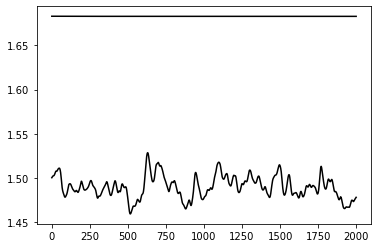

In [11]:
plt.plot( Area[0,0,3,:], 'k-' )
plt.plot( Area[0,1,3,:], 'k' )
# plt.plot( Area[1,0,3,:],  'r--' )
# plt.plot( Area[1,1,3,:],  'r-' )

In [ ]:
#np.min(test_all [1,1,-1,2000,:,:] )

In [ ]:
# import plotly.offline as pyo
# import plotly.graph_objs as go
# # Set notebook mode to work in offline
# pyo.init_notebook_mode()

# n0 = 6850


# fig = go.Figure(
#     data=[go.Surface(z= test_a[1,n0,:,:] )],  # To speed up the 3D surface-plot, we skip every 2 points
#     layout=go.Layout(updatemenus=[dict(type="buttons", buttons=[dict(label="Play", method="animate", args=[None])])]),
#     frames=[go.Frame(data=[go.Surface(z=data_i)], name=str(i)) for i, data_i in enumerate(test_a[1,n0:n0+250:50,:,:])],
# )

# fig.update_layout(  scene = dict(    zaxis = dict(range=[-80,80],),),
#                     width=1000,
#                     height=1000,
#                     margin=dict(r=10, l=10, b=10, t=10),
#                     #title="",
#                    )
# fig.update_traces(showscale=True)
# fig.show()


In [ ]:
# from matplotlib import cm
# from matplotlib.colors import LightSource


# fig = plt.figure( figsize = (12,12) )
# ax = fig.add_subplot(2, 2, 1, projection='3d')
# x = np.linspace(-1, 1, 128)
# y = np.linspace(-1, 1, 128)
# X, Y = np.meshgrid(x, y)

# n0=2000
# Z = test_all[0,0,0,n0]/15

# # create light source object.
# ls = LightSource(azdeg=0, altdeg=55)

# rgb = ls.shade(Z, plt.cm.YlOrBr)

# surf = ax.plot_surface(X, Y, Z, rstride=1, cstride=1, linewidth=0, antialiased=False,   facecolors=rgb) #
# ax.set_zlim(-2, 2)
# #ax.set_axis_off()



In [12]:
#models[3]['Lpi25rho1_list_pred'].shape
test_all.shape

(1, 2, 10, 2000, 128, 128)

In [13]:
#import kaleido
#fig.write_image("Fig_b25r0.png")

models=[
  {'alias':'tFNO150'    ,'act_para':[15,0], 'para_name':'Lpi_rho','para_list':[], 'model_name_detail':'tFNO2D_Nx128_m64_64w20Lpi_rho15_0_share_o20'    },
  {'alias':'tFNO151'    ,'act_para':[15,1], 'para_name':'Lpi_rho','para_list':[], 'model_name_detail':'tFNO2D_Nx128_m64_64w20Lpi_rho15_1_share_o20'    },

    
  {'alias':'tFNO150_k1' ,'act_para':[15,0], 'para_name':'Lpi_rho','para_list':[], 'model_name_detail':'tFNO2D_Nx128_m64_64w20Lpi_rho15_0_share_o20_k1' },
  {'alias':'tFNO151_k1' ,'act_para':[15,1], 'para_name':'Lpi_rho','para_list':[], 'model_name_detail':'tFNO2D_Nx128_m64_64w20Lpi_rho15_1_share_o20_k1' },

#   {'alias':'tFNO250'    ,'act_para':[25,0], 'para_name':'Lpi_rho','para_list':[], 'model_name_detail':'tFNO2D_Nx128_m64_64w20Lpi_rho25_0_share_o20'    },
#   {'alias':'tFNO251'    ,'act_para':[25,1], 'para_name':'Lpi_rho','para_list':[], 'model_name_detail':'rerun3_tFNO2D_Nx128_m64_64w20Lpi_rho25_1_share_o20'    },
#   {'alias':'tFNO250_k1' ,'act_para':[25,0], 'para_name':'Lpi_rho','para_list':[], 'model_name_detail':'rerun_tFNO2D_Nx128_m64_64w20Lpi_rho25_0_share_o20_k1' },
#   {'alias':'tFNO251_k1' ,'act_para':[25,1], 'para_name':'Lpi_rho','para_list':[], 'model_name_detail':'rerun2_tFNO2D_Nx128_m64_64w20Lpi_rho25_1_share_o20_k1' },
    
]

In [19]:
#models[-1] =   {'alias':'tFNO251_k1' ,'act_para':[25,1], 'para_name':'Lpi_rho','para_list':[], 'model_name_detail':'rerun2_tFNO2D_Nx128_m64_64w20Lpi_rho25_1_share_o20_k1' }


In [14]:
#models[1]

In [15]:
def load_pkl( m ):
    str_filename = m['model_name_detail'] 
    if str_filename.find('_ep') >=0:         str_filename  = str_filename[ : str_filename.find('_ep') ]
    if str_filename.find('_best')>=0:        str_filename  = str_filename[ : str_filename.find('_best') ]
    open_file=open('./checkpoints/'+str_filename+ 'trainlog.pkl','rb')
    output_dict= pickle.load(open_file)
    open_file.close()
    train_residual = np.array ( [ os for os  in output_dict['list_output_info'] ] )
    return train_residual 
    
def plot_training_resid( m, list_iy=[2,3], ys='log',ix=0):
    train_residual = load_pkl( m)
    line_style = ['r-', 'g-.','b--','k.']
    for idx, y in enumerate(list_iy):
        plt.plot( train_residual[:,ix], train_residual[:,y], line_style[idx])
    plt.yscale(ys)
    
    return [ train_residual[:, y ][-1] for  y in list_iy ]

def print_train_info( list_iy=[2,3,1], models=models ):
    for idx, m in enumerate( models):
        train_residual = load_pkl( m)
        #----------------
        if 'ONet' in m['model_name_detail']:            method='ONet'
        elif  'FNO' in m['model_name_detail']:      method='Fourier'
        elif  'Conv' in m['model_name_detail']:         method='Conv'
        #----------------
        print(idx, method, m['model_name_detail'], m['nStep'] ,m['Tout'],  [ train_residual[:, y ][-1] for  y in list_iy ] ) 

In [16]:
#plot_training_resid (  models[0], [2,3],  ys='log' )

In [17]:
# list__init_str = 10*['rand_simple']
# list__init_str_LongTerm= np.arange(10)
# list_randseed = np.arange(10)+457
# siva = [
#   {'para_name':'Lpi_rho', 'para_list':[], 'SivaEq':CSolverSiva('MKS_RK4', [[10,0], [40,1]], method_default_siva_data_gen=4), 'N':256 ,'list_randseed':list_randseed  },
# ]


In [18]:
#
# list__init_str =4*['rand_simple']
# list__init_str_LongTerm=[3]
# list_randseed = [1333,121283,112639,12219 ]
# siva = [  {'para_name':'Lpi_rho', 'para_list':[], 'SivaEq':CSolverSiva('MKS_RK4', [[10,0], [40,1]], method_default_siva_data_gen=4), 'N':256 ,'list_randseed':list_randseed  },]
#


In [19]:
test_all.shape[2]
#n = test_all.shape 

10

In [20]:
def get_para_key( para_name, each_para_value):  # note: 'each_para_value' is allowed to be a list of values
    if 'Lpi_rho'== para_name:   return 'Lpi{:d}rho{:g}_'.format(each_para_value[0],each_para_value[1])
    else:                       return '{}{:.3f}_'.format(para_name, each_para_value)
    
def get_d0(i_which, each_para_value):
    i,j = beta_dict[each_para_value[0]], rho_dict[each_para_value[1]]
    return test_all[i,j,i_which, 0,:,:]
    
# def get_d0_all_from_para(each_para_value, list_test_pick = [0,1,2,3,4] ): # nu
#     d0_all=[]
#     for i_which in list_test_pick: 
#         d0 = get_d0(i_which,each_para_value)
#         d0_all.append(d0)
#     return np.array( d0_all )

def get_d0_all_from_para(each_para_value, num_i_which = test_all.shape[2] ): # nu
    d0_all=[]
    for i_which in range(num_i_which): 
        d0 = get_d0(i_which,each_para_value)
        d0_all.append(d0)
    return np.array( d0_all )



In [21]:
num_total_step=2000

def load_model( model_name_detail):
    LocalFull_filename_Saved_Model =  './checkpoints/' + model_name_detail

    model = torch.load( LocalFull_filename_Saved_Model, map_location='cuda')
        
    print(model_name_detail, ' loaded in: count_learnable_params =' + str( count_learnable_params(model) ))
    return model

def get_model(name, para_name,each_para_value, models, bLoadModel=True):
    
    for m in models:
        list_keywords = [ para_name.casefold() ] 

        if m['alias']==name and all( [keyword in m['model_name_detail'].casefold() for keyword in list_keywords ] ):

            if 'model' not in m  and bLoadModel==True:
                m['model'] = load_model( m['model_name_detail'] )
                
            if each_para_value not in m['para_list']:
                assert( each_para_value == m['act_para'] )
                m = update_model_pred( m, {'para_name':para_name,'para_list':[each_para_value] } )
            return m
        
    print( m['model_name_detail'])                
    raise ValueError('did not find model')

def update_model_pred(m, para_dict):
    m = get_model_pred(m, para_dict)
    return m

def get_model_pred(m, para_dict):
    para_name = para_dict['para_name']
    para_list = para_dict['para_list']


    NotYetReady__para_list = []
    for each_para_value in para_list:
        if each_para_value not in m['para_list']:
            NotYetReady__para_list.append(each_para_value)
    #-----
    for each_para_value in NotYetReady__para_list:
        
        #---
        each_para_key = get_para_key(para_name, each_para_value)
        #d0       = sys[each_para_key+'list_d_an'][:,0,:] 
        d0       = get_d0_all_from_para(each_para_value)
        
        #print('each_para_key', each_para_key)
        #print('d0', d0.shape)
        
        d0_torch = torch.tensor(d0,dtype=torch.float).unsqueeze(-1)

        model = m['model']
        model.eval()
        
        with torch.no_grad():
            
            xx = d0_torch
            xx = xx.to(device)
            #print('get_model_pred: xx.shape', xx.shape)
            #print('get_model_pred: nu', nu)
            batch_size = xx.shape[0]
            
            #pdepara = torch.tile( torch.tensor(each_para_value,dtype=torch.float), (batch_size,1) ).to(device) 
            
            if '_k1' in m['model_name_detail']:      #  print('debug_test_else', xx) 

                for t in range(num_total_step):
                    im = model(xx )    # ,pdepara  )  
                    #--------------------
                    if t == 0:     pred = torch.cat((  xx, im), -1)
                    else:          pred = torch.cat((pred, im), -1)
                    #xx = torch.cat((xx[..., 1 * data_channel:], im), dim=-1)
                    xx = im
                    
            else:                         # if '_O' in m['model_name_detail']:
                
                T_out = 20 # 100
                for t in range(num_total_step//T_out):
                    im = model(xx )     # , pdepara   )  
                    im = im.view( *im.shape[:-2], im.shape[-1] )
                    #--------------------
                    #print(t, 'im.shape=', im.shape, 'xx.shape=',xx.shape)
                    if t == 0:     pred = torch.cat((  xx, im[...,:T_out]), -1)
                    else:          pred = torch.cat((pred, im[...,:T_out]), -1)
                    #xx = im[...,-1:]
                    xx = im[...,T_out-1:T_out]
            
        m['para_list'].append(each_para_value)
    
        list_pred = pred.detach().cpu().numpy()                   # list_pred.shape == (4, 512, 2000)
        
        
       
        m[each_para_key+'list_pred'] = np.moveaxis(list_pred,-1,1)
        #m['list_pred'] = np.moveaxis(list_pred,1,-1)
        
        print(each_para_key+'list_pred.shape=', m[each_para_key+'list_pred'].shape)

        #----
        # nu = m['nu']
        # sys = get_sys(nu)    
        #----
        m[each_para_key+'list_NormalizedTotalLen_pred'] = Calc2dFlameArea( m[each_para_key+'list_pred'],each_para_value[0])
        
        #libData.dsol_to_whole_length(m['x'], m[each_para_key+'list_pred']  )

    return m

In [22]:
#test_all.shape

In [23]:
def alias_to_lengend_txt( model_alias ):
    text_legend = 'Error'
    if any( x in model_alias  for x in ['kFNO','tFNO'] ):
        if '_k1' in  model_alias : 
            text_legend =  'FNO'  # standard FNO
        elif '_tAdvD1' in  model_alias : 
            text_legend =  'kFNO*'   # standard FNO
        elif '_Ftime' in  model_alias : 
            text_legend =  'kFNO'+r'$^\dagger$'  # standard FNO
        else: 
            text_legend =  'kFNO' 
    elif 'kConv' in model_alias: 
    
        if '_k1' in  model_alias : 
            text_legend = 'CNN'
        else: 
            text_legend =  'kCNN' 
    return text_legend          



In [70]:
def plot_para_len (all_list_models_for_cmp, all_list_init,  png_filename=None, ylim=(0.9,2.1) , models= models ):

    num_steps_for_plot= 2000
    nRow_per_init = 1 #
    
    #fig, axs = plt.subplots(nRow_per_init*len( all_list_models_for_cmp[0] ),len(all_list_init),sharex=True, sharey=True,figsize= [12,0.8*2*len(all_list_models_for_cmp[0])*nRow_per_init ])
    fig, axs = plt.subplots(nRow_per_init*len( all_list_models_for_cmp[0] ),len(all_list_init),sharex=True, figsize= [12, 1*2*len(all_list_models_for_cmp[0])*nRow_per_init ])

    for idx_ , list_models_for_cmp in enumerate(all_list_models_for_cmp):
        for  i_nu, models_for_cmp in enumerate(list_models_for_cmp):
            #---
            m_all       = [ get_model(**m_ , models= models ) for m_ in models_for_cmp]

            #---
            each_para_key_all = [ get_para_key( m_['para_name'], m_['each_para_value']) for m_ in models_for_cmp] 
            pred_all          = [ m_[each_para_key+'list_pred'] for m_ , each_para_key in zip(m_all,each_para_key_all) ]     
            #---

            i_beta, j_rho = beta_dict [ m_all[0]['act_para'][0] ] , rho_dict [ m_all[0]['act_para'][1] ] 
            
            len_an_all        = Area[i_beta,j_rho,:, :num_steps_for_plot ]   # m_all[0]['sys'] [each_para_key_all[0]+'list_NormalizedTotalLen_an']
            len_pred_all      = [ m_[each_para_key_all[idx]+'list_NormalizedTotalLen_pred'] for idx, m_ in enumerate(m_all) ] 


            #----------------------
            list_plot_style = ['-r','-.b',':c','--g', ':m',':b']
            #--------------------------------------------------------------------
            #list_legend =['Ref'] +  ['$'+ m['name'] + '$' for m in models_for_cmp ]
            list_legend =['Ref'] +  [ alias_to_lengend_txt(m['name'])  for m in models_for_cmp ]

            ax = axs[i_nu,idx_ ]
            ################################
            i_d0 = all_list_init[idx_][0]

            ax.set_yticks( [ 1, 1.5, 2 ] )
            ax.set_yticklabels(['1', '1.5' , '2'], rotation='vertical',  fontsize=12 )
            ax.set_xticks( [ 0,  500, 1000, 2000] )
            ax.set_xticklabels(['0','500', '1000' ,'2000'], fontsize=12)
            ax.set_xlabel( 't/0.074', fontsize=14) 
            #ax.set_ylim(.9,2.1)
            
            ax.set_ylim(*ylim)
            if i_nu > 1: 
                ax.set_ylim(0.99,1.55)


            len_an = len_an_all[i_d0]
            nnn=np.arange( num_steps_for_plot)

            ax.plot( nnn, len_an[:num_steps_for_plot],'--k' , lw=1)
            list_len_pred = [ len_[i_d0] for len_ in  len_pred_all ] 

            for idx, len_pred in enumerate( list_len_pred):
                nnn = np.arange( num_steps_for_plot    )  
                ax.plot(nnn, len_pred[:num_steps_for_plot], list_plot_style[idx] , lw=1)

                
            #ax.legend(list_legend , ncol=2,  loc='lower right', fontsize=10)
            if i_nu==0 and idx_== len(all_list_init)-1:
                ax.legend(list_legend , ncol=3,  loc='lower right', fontsize=12, frameon=True, borderpad=0,labelspacing=0.1)
                
                #ax.set_title(r'$\beta={:g}$'.format(models_for_cmp[0]['each_para_value'][0] ) , fontsize=14 ) 

            if idx_== len(all_list_init)-1: 
                #ax2 = ax.twinx()
                ax.yaxis.set_label_position("right")
                para = models_for_cmp[0]['each_para_value']
                #list_RightText =  r"$\beta={:g},\rho={}$".format(para[0], Fraction(para[1]) )
                txt_instablity = 'DL' if para[1]==1  else 'DT' 
                list_RightText = txt_instablity + r', $\beta$={}'.format( para[0])

                #list_RightText =  r"$\rho={}$".format( Fraction(para[1])   )
                ax.set_ylabel(list_RightText,  fontsize=14  )
                #ax2.set_yticks([])                
            ########################################################

            #-----------
    for ax in axs.flat:
        ax.label_outer()

    #plt.subplots_adjust(left=0.045, right=0.98, top=0.99, bottom=0.13, wspace=0.02, hspace=0.02)
    #plt.subplots_adjust(left=0.053, right=0.975, top=0.975, bottom=0.08, wspace=0.02, hspace=0.02)
    plt.subplots_adjust(left=0.073, right=0.975, top=0.975, bottom=0.15, wspace=0.02, hspace=0.02)
    
    #fig.text(0.4, 0.001, 't/0.015', ha='center',fontsize=14)
    fig.text(0.001, 0.52, 'Normalized total 2d-front area \n    $    \int (\phi_x^2+\phi_y^2 +1 )^{1/2} dx /(4\pi^2)  $  ', va='center', rotation='vertical',fontsize=14 )
    #fig.text(0.001, 0.52, r'Normalized total 2d-front area', va='center', rotation='vertical',fontsize=14 )

    #---------------------
    if png_filename is not None:
        print('savefig: ', png_filename)
        if 'eps' in png_filename:
            plt.savefig(png_filename, format='eps')
        else:
            plt.savefig(png_filename, dpi=300)            


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


savefig:  len_2Dfront.eps


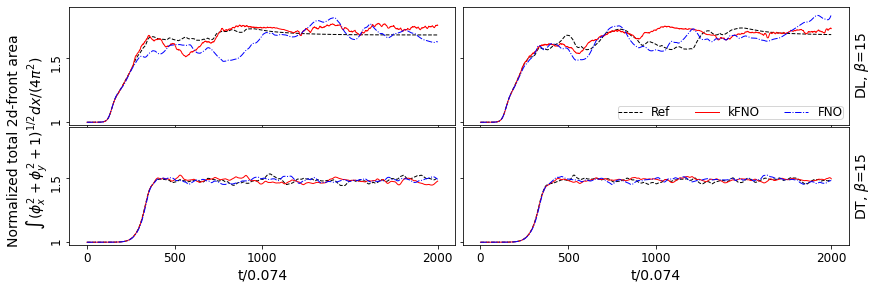

In [71]:
all_list_init = [ [2],[0]]  #[2] 

# all_list_para_values =[  [25,1],  [15,1],    [25,0],   [15,0]  ]
# all_list_model_names =[  ['tFNO251','tFNO251_k1'], 
#                          ['tFNO151','tFNO151_k1'], 
#                          ['tFNO250','tFNO250_k1'],
#                          ['tFNO150','tFNO150_k1']  ]

all_list_para_values =[   [15,1],     [15,0]  ]
all_list_model_names =[  ['tFNO151','tFNO151_k1'],
                         ['tFNO150','tFNO150_k1']  ]

all_list_models_for_cmp =[ 
                         [ [{'name':model_name, 'para_name':'Lpi_rho','each_para_value': para_value } 
                         for model_name in list_model_names     ] 
                         for list_model_names, para_value in zip(all_list_model_names, all_list_para_values) ]
                         for j,_  in enumerate(all_list_init)     ]
#------------------------------------

#png_filename = None
png_filename = 'len_2Dfront.eps'
plot_para_len ( all_list_models_for_cmp, all_list_init , png_filename, ylim=(0.98,1.9), models= models)


In [52]:
def get_corr(data,cases_valids=None, N=N):
    k0 = np.fft.fftfreq(N,1/N).reshape(-1,1)
    k1 = np.fft.fftfreq(N,1/N)[:N//2+1].reshape(1,-1)
    kk=np.sqrt(k0**2+k1**2)
    

    
    pre_shape = data.shape[:-4]
    spectrum = np.zeros(  (*pre_shape, N) )
    
    print('spectrum.shape=', spectrum.shape)
    if cases_valids is None:
        cf = np.fft.rfft2 ( data[...,500:,:,:] )
    else: 
        cf = np.fft.rfft2 ( data[...,cases_valids,500:,:,:] )
        
    print('cf.shape=', cf.shape)
    for i in range(N):
        for j in range(N//2+1):
            idx = int ( kk[i,j] )
            spectrum[...,idx] += np.average(  np.abs(cf[...,i,j])**2  , axis = (-2,-1) )    #kk[...,i,j]**2 

    corr=np.fft.irfft(spectrum[...,:N//2+1] ).real
    corr = corr/corr[...,0:1]
    return corr

In [53]:
corr_refence = get_corr( test_all )

spectrum.shape= (1, 2, 128)
cf.shape= (1, 2, 10, 1500, 128, 65)


In [54]:
corr_00_pred = get_corr(models[0]['Lpi15rho0_list_pred'])


spectrum.shape= (128,)
cf.shape= (10, 1501, 128, 65)


In [55]:
corr_01_pred = get_corr(models[1]['Lpi15rho1_list_pred'], cases_valids=[0,2,6])

spectrum.shape= (128,)
cf.shape= (3, 1501, 128, 65)


In [56]:
# corr_10_pred = get_corr(models[2]['Lpi25rho0_list_pred'])
# corr_11_pred = get_corr(models[3]['Lpi25rho1_list_pred'])

In [ ]:
# fig,axs = plt.subplots(1,4,figsize=(10,2))
# axs[0].plot(corr_refence[0,0][:N//2],'k')
# axs[0].plot(corr_00_pred[:N//2],'r--')

# axs[1].plot(corr_refence[0,1][:N//2],'k')
# axs[1].plot(corr_01_pred[:N//2],'r--')

# axs[2].plot(corr_refence[1,0][:N//2],'k')
# axs[2].plot(corr_10_pred[:N//2],'r--')

# axs[3].plot(corr_refence[1,1][:N//2],'k')
# axs[3].plot(corr_11_pred[:N//2],'r--')


In [72]:
def plot_2d_autocorrelation(list_models_for_cmp,  line_legend,  png_filename=None, models= models,ylim=None) :
        
    beta_i_rho_j   = [ models_for_cmp[0]['each_para_value'] for models_for_cmp in list_models_for_cmp ]
    str__para_name = [ 'DL'+ r', $\beta$={}'.format( models_for_cmp[0]['each_para_value'][0]) if models_for_cmp[0]['each_para_value'][1]==1  else 'DT'+ r', $\beta$={}'.format( models_for_cmp[0]['each_para_value'][0])   for models_for_cmp in list_models_for_cmp ]
    
    #---------------        
    N_end = num_total_step+1 
    nCase = len( list_models_for_cmp )
    # -------------
    

    #corr_refence = get_corr( test_all )
    
    fig, axs = plt.subplots(1,nCase ,sharey=True, figsize= [4*1.5, 1*2.5 ])

    for ax, t1  in zip(axs, str__para_name):
        ax.set_title( t1, fontsize= 15 ) #, pad=15)
    
    for icase, models_for_cmp in enumerate(list_models_for_cmp):
        for idx, m_info       in enumerate(models_for_cmp):
            m             = get_model(**m_info , models= models) 
            each_para_key = get_para_key( m_info['para_name'], m_info['each_para_value'])  
            pred          = m[each_para_key+'list_pred'] 
            label         = alias_to_lengend_txt( m_info['name'] ) 
            
            # --------------------
            i_beta, j_rho = beta_dict [ beta_i_rho_j[icase][0] ], rho_dict [ beta_i_rho_j[icase][1] ] 
            
            # d_an = test_all[i_beta,j_rho,:,:N_end,:,:]
            if idx ==0: 
                corr_an = corr_refence[i_beta,j_rho,:N//2+1]
                axs[icase].plot( corr_an    , color='lightgrey',  linewidth=4 ,label='Ref' )
            
            if i_beta == 0 and j_rho == 1:
                corr    = get_corr( pred, cases_valids = [0,2,6])
            else: 
                corr    = get_corr( pred )
                
                
            axs[icase].plot( corr[:N//2+1]     , line_legend[idx]  ,linewidth=1, label = label)


            str__para_name = r'$\rho$='  if models_for_cmp[0]['para_name']=='nu' else r'$\beta$=' 

            #if icase ==0:
            #txt_instablity = 'DL' if  models_for_cmp[i]['each_para_value'][1]==1  else 'DT' 
            #ax.set_title( txt_instablity + r', $\beta={}$'.format( Fraction( models_for_cmp[i]['each_para_value'][0] ) ), fontsize=14)

            if icase ==nCase-1:
                #txt_legends = ['Ref']+ [ alias_to_lengend_txt(models_for_cmp[0]['name']) for models_for_cmp in list_models_for_cmp] 
                #ax.legend(txt_legends, fontsize=13,  frameon=True, borderpad=0,labelspacing=0.1)
                axs[icase].legend( fontsize=13,  frameon=True, borderpad=0,labelspacing=0.1)
                
            axs[icase].set_ylabel('$\mathcal{R}(|r|)$',fontsize=14)

            #-----------
    for ax in axs.flat:
        ax.label_outer()
        ax.set_xlim( [0,N//2])
        ax.set_xticks( [0,   N//2] )
        ax.set_xticklabels(['0',  '$\pi$'  ] , fontsize=12 )
        ax.set_xlabel('$|r|$',fontsize=13)
        ax.set_yticks( [-1/2, 0,1/2, 1] )
        ax.set_yticklabels(['-0.5', '0','0.5','1' ] , fontsize=12 )

        if ylim is not None:
            ax.set_ylim( ylim )
        
    fig.subplots_adjust(wspace=0.06,hspace=0.02)
    fig.tight_layout( )

        
    if png_filename is not None:
        print('save png: ',png_filename )
        plt.savefig(png_filename,dpi=300)

spectrum.shape= (128,)
cf.shape= (3, 1501, 128, 65)
spectrum.shape= (128,)
cf.shape= (3, 1501, 128, 65)
spectrum.shape= (128,)
cf.shape= (10, 1501, 128, 65)
spectrum.shape= (128,)
cf.shape= (10, 1501, 128, 65)


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


save png:  corr_2Dfront.eps


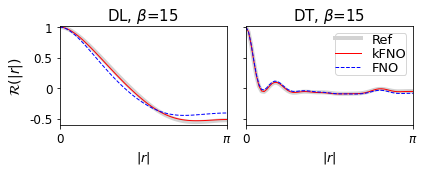

In [73]:
#bAutoCorr = True # False

# All_list_para_values =[ [25,1],    [15,1],  [25,0],        [15,0]   ]
# All_list_model_names =[  ['tFNO251','tFNO251_k1' ], 
#                          ['tFNO151','tFNO151_k1' ], 
#                          ['tFNO250','tFNO250_k1' ],
#                          ['tFNO150','tFNO150_k1' ]  ]

All_list_para_values =[     [15,1],        [15,0]   ]
All_list_model_names =[  ['tFNO151','tFNO151_k1' ],
                         ['tFNO150','tFNO150_k1' ] ]

list_models_for_cmp =[ [{'name':model_name, 'para_name':'Lpi_rho','each_para_value': list_para_values} for model_name in All_list_model_names[idx]  ] 
                         for idx, list_para_values in enumerate(All_list_para_values) ] 
line_legend = ['r-', 'b--','r-.','r:', 'b-','b:'] 

png_filename= 'corr_2Dfront.eps'
plot_2d_autocorrelation(list_models_for_cmp,  line_legend,  png_filename=png_filename, models= models, ylim=[-0.6,1.01])



In [ ]:
#plot_para_autocorrelation(list_models_for_cmp, i_pickplot=3, png_filename=png_filename, models= models, bAutoCorr = bAutoCorr ,n_steady = 500)

In [66]:
def plot_space_errors(list_models_for_cmp ,list_i_pickplot,  png_filename=None, models= models) : # list__i_pickplot__init_d0=[1]
    import matplotlib.gridspec as gridspec

    beta_i_rho_j   = [ models_for_cmp[0]['each_para_value'] for models_for_cmp in list_models_for_cmp ]
    str__para_name = [ 'DL'+ r', $\beta$={}'.format( models_for_cmp[0]['each_para_value'][0]) if models_for_cmp[0]['each_para_value'][1]==1  else 'DT'+ r', $\beta$={}'.format( models_for_cmp[0]['each_para_value'][0])   for models_for_cmp in list_models_for_cmp ]
    
#     list__m_all           = []
#     list__each_para_key_all=[]
#     list__pred_all          =[]
#     for models_for_cmp in list_models_for_cmp:
#         m_all     = [ get_model(**m_ , models= models) for m_ in models_for_cmp]
#         each_para_key_all = [ get_para_key( m_['para_name'], m_['each_para_value']) for m_ in models_for_cmp] 
#         beta_i_rho_j = [  m_['each_para_value'] for m_ in models_for_cmp] 
#         pred_all = [ m_[each_para_key+'list_pred'] for m_ , each_para_key in zip(m_all,each_para_key_all) ] 
#         list__pred_all.append(pred_all )
#         list__each_para_key_all.append(each_para_key_all)
    #-----------
#     str__para_name        = r'$\rho$='  
#     str__para_name_legend = [ 'DL'+ r', $\beta$={}'.format( m['each_para_value'][0]) if m['each_para_value'][1]==1  else 'DT'+ r', $\beta$={}'.format( m['each_para_value'][0])   for m in models_for_cmp ]
    #---------------        
    levels= np.linspace(0,0.1,100)
    cmap= 'rainbow'

    #-----------
    N_end = num_total_step #+1
    #------
    nCase = len(list_models_for_cmp)
    num_models = len(list_models_for_cmp[0]) 
    num_pickplot = len(list_i_pickplot)
    fig, axs = plt.subplots(nCase,4 ,sharex=True, figsize= [4*2 ,2*2 ])
    
    #----------
    #for ax, t1  in zip(axs[0], str__para_name):
    #    ax.set_title( t1, fontsize= 15 , pad=15)
    
    for ax, t1  in zip(axs[0], ["$t/\Delta_t'=100$","$t/\Delta_t'=200$","$t/\Delta_t'=300$","$t/\Delta_t'=400$"]):
    #for ax, t1  in zip(axs[0], ["$t/0.075=100$","$t/0.075=200$","$t/0.075=300$","$t/0.075=400$"]):
        ax.set_title( t1, fontsize= 15 , pad=15)

        
        
    rows = ['{:g}'.format( models_for_cmp[0]['each_para_value'][0] ) for models_for_cmp in list_models_for_cmp ]
        
    #-----------------------
    for icase, models_for_cmp in enumerate(list_models_for_cmp):
        for idx, m_info       in enumerate(models_for_cmp):
            m             = get_model(   **m_info , models= models) 
            each_para_key = get_para_key(  m_info['para_name'], m_info['each_para_value'])  
            pred          = m[each_para_key+'list_pred'] 
            #label         = alias_to_lengend_txt( m_info['name'] ) 
            
            i_pickplot = list_i_pickplot[0]
            # --------------------
            i_beta, j_rho = beta_dict [ beta_i_rho_j[icase][0] ], rho_dict [ beta_i_rho_j[icase][1] ] 
            d_an = test_all[i_beta,j_rho,i_pickplot,:N_end,:,:]
            
            pred_pickplot =  pred[i_pickplot,:N_end,:,:]
            error_L2 = ((pred_pickplot - d_an)**2/(d_an**2).mean(axis=(-3,-2,-1),keepdims=True))**0.5 

            pos = axs[icase, 0].contourf( error_L2[100,:,:] ,  levels = levels ,cmap=cmap )   
            pos = axs[icase, 1].contourf( error_L2[200,:,:] ,  levels = levels ,cmap=cmap )   
            pos = axs[icase, 2].contourf( error_L2[300,:,:] ,  levels = levels ,cmap=cmap )   
            pos = axs[icase, 3].contourf( error_L2[400,:,:] ,  levels = levels ,cmap=cmap )   

            # axs[icase,0].set_axis_off()
            # axs[icase,1].set_axis_off()
            # axs[icase,2].set_axis_off()
            for ax in axs[icase]: 
                ax.set_xticks([])
                ax.set_yticks([])

            axs[icase,3].yaxis.set_label_position("right")            
            axs[icase,3].set_ylabel(str__para_name[icase], fontsize=14  )
                #--------------------



    for ax in axs.flat:
        ax.label_outer()
        #ax.set_xlim([0,200])

    fig.tight_layout( )
    fig.subplots_adjust(wspace=0.05,hspace=0.05)
    
        
    if png_filename is not None:
        print('save png: ',png_filename )
        plt.savefig(png_filename,dpi=300)
        

save png:  err_2Dfront.png


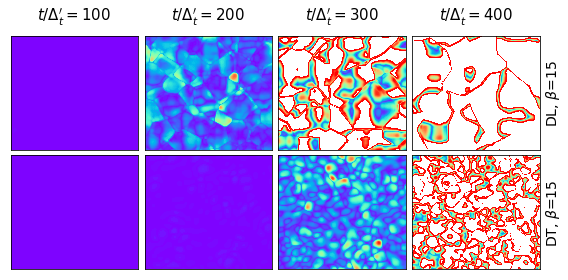

In [67]:

# All_list_para_values =[ [25,1],    [15,1],  [25,0],        [15,0]   ]
# All_list_model_names =[  ['tFNO251',  ], ['tFNO151', ],  ['tFNO250', ], ['tFNO150', ]  ]

All_list_para_values =[      [15,1],        [15,0]   ]
All_list_model_names =[  ['tFNO151', ],   ['tFNO150', ]  ]


# list_models_for_cmp =[ [{'name':All_list_model_names[idx][j], 'para_name':'Lpi_rho','each_para_value': list_para_values } 
#                          for idx, list_para_values in enumerate(All_list_para_values) ] ]
                         
list_models_for_cmp =[  [{'name':model_name, 'para_name':'Lpi_rho','each_para_value': list_para_values} for model_name in All_list_model_names[idx]  ] 
                         for idx, list_para_values in enumerate(All_list_para_values) ] 

    
png_filename= 'err_2Dfront.png'
plot_space_errors(list_models_for_cmp,  list_i_pickplot =[4], png_filename=png_filename, models= models)

In [36]:
num_total_step

2000

In [76]:
def plot_compressed_errors(list_models_for_cmp ,line_legend,  png_filename=None, models= models) : # list__i_pickplot__init_d0=[1]
    import matplotlib.gridspec as gridspec
    import numpy as np
    
    
    beta_i_rho_j   = [ models_for_cmp[0]['each_para_value'] for models_for_cmp in list_models_for_cmp ]
    str__para_name = [ 'DL'+ r', $\beta$={}'.format( models_for_cmp[0]['each_para_value'][0]) if models_for_cmp[0]['each_para_value'][1]==1  else 'DT'+ r', $\beta$={}'.format( models_for_cmp[0]['each_para_value'][0])   for models_for_cmp in list_models_for_cmp ]
    
    
    #---------------        
    N_end = num_total_step #+1 
    nCase = len( list_models_for_cmp )

    fig, axs = plt.subplots(2,nCase ,sharex=True, sharey=True, figsize= [4.2*1.3, 4*1 ])
    for icase, models_for_cmp in enumerate(list_models_for_cmp):
        for idx, m_info       in enumerate(models_for_cmp):
            m             = get_model(**m_info , models= models) 
            each_para_key = get_para_key( m_info['para_name'], m_info['each_para_value'])  
            pred          = m[each_para_key+'list_pred'] 
            label         = alias_to_lengend_txt( m_info['name'] ) 
            
            # --------------------
            #d_an     = m_all[icase]['sys'][each_para_key_all[icase]+'list_d_an'][ ...,:N_end]
            i_beta, j_rho = beta_dict [ beta_i_rho_j[icase][0] ], rho_dict [ beta_i_rho_j[icase][1] ] 
            d_an = test_all[i_beta,j_rho,:,:N_end,:,:]
            
            
            #-----------    

            pred = pred[:,:N_end,...] #  pred_all[icase][:N_end,...]

            #print(idx,icase, d_an.shape,pred_pickplot.shape)
            

            y = np.sqrt( (pred - d_an)**2/(d_an**2).mean( axis=(-3,-2,-1),keepdims=True ) ) 
            

            for i_row in range(2):
                y1 = y[i_row::2,:,:].mean( axis=(-4,-2,-1), keepdims=False ) 

                axs[i_row, icase].plot( np.arange(N_end),  y1  , line_legend[idx]  , label =  label  )   
                
            #axs[1,icase].plot( np.arange(N_end),  y2  , line_legend[idx]  , label =  label  )   


            for i_row in range(2): 
                axs[i_row, icase].set_xlim([1,300])
                axs[i_row, icase].set_xticks( [ 1,  150 , 300] );    
                axs[i_row, icase].set_xticklabels(['1','150','300' ] , fontsize=11 )
#                 if icase==0:
#                 else:
#                     axs[icase].set_xlim([1,300])
#                     axs[icase].set_xticks( [ 1,  150,300 ] );    
#                     axs[icase].set_xticklabels(['1','150', '300'  ] , fontsize=11 )
            
            if icase==1 :
                axs[0,icase].legend(fontsize=12)
    
            axs[0,icase].set_title(str__para_name[icase], fontsize=13)
            axs[1,icase].set_xlabel("$t/0.074$",   fontsize=11)
        
    for ax in axs.flat:
        ax.label_outer()
        ax.set_ylim ( [5e-5,0.2] )
        ax.set_yscale('log')

    
    #----------------
    fig.tight_layout( )
    #fig.subplots_adjust(wspace=0.15,hspace=0.15, bottom=0.41) 
    

    #list_text_legend =[ alias_to_lengend_txt(models_for_cmp[0]['name'])   for models_for_cmp in list_models_for_cmp ]
    
    #----------------
    #lines, labels = axs[-1].get_legend_handles_labels()
    #fig.legend(lines, labels, ncol=len( labels ), fontsize=12,  loc = 'lower center' )
    
    #---------------
    
    if png_filename is not None:
        print('save png: ',png_filename )
        plt.savefig(png_filename,dpi=300)    
                    


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


save png:  ave_err_2Dfront.eps


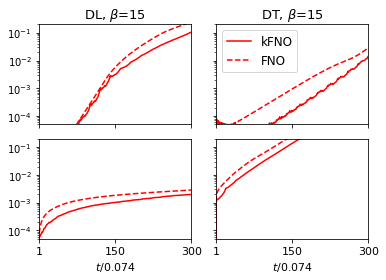

In [77]:

# All_list_para_values =[ [25,1],                   [15,1],                   [25,0],                      [15,0]   ]
# All_list_model_names =[  ['tFNO251','tFNO251_k1' ], 
#                          ['tFNO151','tFNO151_k1' ], 
#                          ['tFNO250','tFNO250_k1' ],
#                          ['tFNO150','tFNO150_k1' ]  ]

All_list_para_values =[        [15,1],                              [15,0]   ]
All_list_model_names =[  ['tFNO151','tFNO151_k1' ], 
                         ['tFNO150','tFNO150_k1' ]  ]

# list_models_for_cmp =[ [{'name':All_list_model_names[idx][j], 'para_name':'Lpi_rho','each_para_value': list_para_values } 
#                          for idx, list_para_values in enumerate(All_list_para_values) ] 
#                          for j in  range(2) ]

list_models_for_cmp =[ [{'name':model_name, 'para_name':'Lpi_rho','each_para_value': list_para_values} for model_name in All_list_model_names[idx]  ] 
                         for idx, list_para_values in enumerate(All_list_para_values) ] 

line_legend = ['r-', 'r--','r-.','r:', 'b-','b:'] 

png_filename= 'ave_err_2Dfront.eps'
plot_compressed_errors(list_models_for_cmp,  line_legend,  png_filename=png_filename, models= models)

In [42]:
#fig.show()

import plotly.offline as pyo
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Set notebook mode to work in offline
pyo.init_notebook_mode()

n0=2000-1

fig = make_subplots(rows=2, cols=4,
                    specs=[[{'is_3d': True}, {'is_3d': True},{'is_3d': True}, {'is_3d': True}],
                           [{'is_3d': True}, {'is_3d': True},{'is_3d': True}, {'is_3d': True}]],
                    #subplot_titles=['MS', 'KS'],
                    #vertical_spacing=0.,
                    #shared_xaxes=True,                    shared_yaxes=True,
                    horizontal_spacing = 0.0,  vertical_spacing  = 0.0,
#                     subplot_titles=(r"$\text{DL,} \beta=25\text{(Ref)}$", 
#                                     r"$\text{DL,} \beta=25\text{(Ref)}$", 
#                                     r"$\text{DT,} \beta=25\text{(Ref)}$",
#                                     r"$\text{DT,} \beta=15\text{(Ref)}$",
#                                     r"$\text{DL,} \beta=25\text{(kFNO)}$", 
#                                     r"$\text{DL,} \beta=15\text{(kFNO)}$", 
#                                     r"$\text{DT,} \beta=25\text{(kFNO)}$",
#                                     r"$\text{DT,} \beta=15\text{(kFNO)}$")
                    subplot_titles=(r"$\text{DL},t/\Delta_t'=300\text{(Ref)}$", 
                                    r"$\text{DL},t/\Delta_t'=300\text{(kFNO)}$", 
                                    r"$\text{DT},t/\Delta_t'=300\text{(Ref)}$",
                                    r"$\text{DT},t/\Delta_t'=300\text{(kFNO)}$",
                                    r"$\text{DL},t/\Delta_t'=2000\text{(Ref)}$", 
                                    r"$\text{DL},t/\Delta_t'=2000\text{(kFNO)}$", 
                                    r"$\text{DT},t/\Delta_t'=2000\text{(Ref)}$",
                                    r"$\text{DT},t/\Delta_t'=2000\text{(kFNO)}$")
                    )



kkk = 2
# fig.add_trace(go.Surface(z=test_all[1,1,kkk,n0]/25, showscale=False ),  row=1,col= 1)
# fig.add_trace(go.Surface(z=test_all[0,1,kkk,n0]/15,showscale=False),   row= 1, col=2)
# fig.add_trace(go.Surface(z=test_all[1,0,kkk,n0]/25, showscale=False),  row= 1, col=3)
# fig.add_trace(go.Surface(z=test_all[0,0,kkk,n0]/15,showscale=False , ),   row= 1, col=4) #colorbar_len=0.2,


# cc0 = models[3]['Lpi25rho1_list_pred'][kkk,-1,:,:]/25
# cc1 = models[1]['Lpi15rho1_list_pred'][kkk,-1,:,:]/15
# cc2 = models[2]['Lpi25rho0_list_pred'][kkk,-1,:,:]/25
# cc3 = models[0]['Lpi15rho0_list_pred'][kkk,-1,:,:]/15

# fig.add_trace(go.Surface(z= cc0, showscale=False ),  row=2,col= 1)
# fig.add_trace(go.Surface(z= cc1,showscale=False),    row= 2, col=2)
# fig.add_trace(go.Surface(z= cc2, showscale=False),   row= 2, col=3)
# fig.add_trace(go.Surface(z= cc3, showscale=False , ),   row= 2, col=4)

#---------------------
fig.add_trace(go.Surface(z=test_all[0,1,kkk,300]/15, showscale=False ),  row=1,col= 1)
fig.add_trace(go.Surface(z=test_all[0,1,kkk,n0]/15,showscale=False),   row= 2, col=1)
fig.add_trace(go.Surface(z=test_all[0,0,kkk,300]/15, showscale=False),  row= 1, col=3)
fig.add_trace(go.Surface(z=test_all[0,0,kkk,n0]/15,showscale=False , ),   row= 2, col=3) #colorbar_len=0.2,

cc0 = models[1]['Lpi15rho1_list_pred'][kkk,300,:,:]/15
cc1 = models[1]['Lpi15rho1_list_pred'][kkk,n0,:,:]/15
cc2 = models[0]['Lpi15rho0_list_pred'][kkk,300,:,:]/15
cc3 = models[0]['Lpi15rho0_list_pred'][kkk,n0,:,:]/15

fig.add_trace(go.Surface(z= cc0, showscale=False ),  row=1,col= 2)
fig.add_trace(go.Surface(z= cc1,showscale=False),    row= 2, col=2)
fig.add_trace(go.Surface(z= cc2, showscale=False),   row= 1, col=4)
fig.add_trace(go.Surface(z= cc3, showscale=False , ),   row= 2, col=4)



camera = dict(
    up=dict(x=0, y=0, z=1),
    center=dict(x=0, y=0, z= -0.2),
    eye=dict(x=1, y=1, z=1)

)

scene_dict=dict(zaxis = dict(range=[-1.69,1.69], showgrid = False,showticklabels = False,title=''), 
                xaxis = dict(              showgrid = False,showticklabels = False,title=''),
                yaxis = dict(              showgrid = False,showticklabels = False,title=''),
                aspectratio=dict(x=1, y=1, z=0.6),
               camera=camera,
                #colorbar=dict(lenmode='fraction', len=0.75)
                #xaxis_visible=False, yaxis_visible=False,zaxis_visible=False,
               )#aspectmode='data' )



fig.update_layout(  scene1=scene_dict,scene2= scene_dict, scene3=scene_dict,scene4 =scene_dict,
                   scene5=scene_dict,scene6= scene_dict, scene7=scene_dict,scene8 =scene_dict,
                    width=1000, height=700, 
                    #width=1500, height=800, 
                  margin=dict(r=0, l=0), # , b=0.1, t=0.1),                  
                  #coloraxis_colorbar=dict( lenmode='fraction', len=.50)
                  
                 )

# fig.layout.scene1.camera.eye=dict(x=2, y=2, z=1)
# fig.layout.scene2.camera.eye=dict(x=2, y=2, z=1)
# fig.layout.scene3.camera.eye=dict(x=2, y=2, z=1)
# fig.layout.scene4.camera.eye=dict(x=2, y=2, z=1)

# camera = dict(
#     up=dict(x=0, y=0, z=1),
#     center=dict(x=0, y=0, z=0),
#     eye=dict(x=1.25, y=1.25, z=1.25)

#fig.update_layout(height=500, width=1000 )
fig.show()
